## COVID Tissue Atlas: Data processing for a single organ
Covid Tissue Atlas, CZ Biohub <br>
Author: Alejandro Granados <br>github: agranado<br>
Date: Sep 1st 2021 <br>

We applied CellBender with FDR 0.01 to the raw counts for decontamination. This notebook applies quality control, batch correction and annotation of cell types for the Heart samples of the COVID Tissue Atlas. 

 - Batch correction requires SCVI tools
 - Doublet detection requires scrublet
 - Visualization: seaborn 

In [1]:
# sample name for adata object
# example: creating adata object for all prostate samples from 10x files (sample_name = 'prostate')

sample = 'heart/'
tissue = sample.split('/')[0]
sample_name = sample + '_cb'

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scanpy as sc
import os
import scvi
import sys 

sys.path.append('/mnt/ibm_lg/covid_tissue_atlas/CovidTissueAtlas/cta_utils/')
import utils

/data/alejandro/miniconda3/envs/scanpy/lib/python3.8/site-packages/pytorch_lightning/metrics/__init__.py:43: LightningDeprecationWarning: `pytorch_lightning.metrics.*` module has been renamed to `torchmetrics.*` and split off to its own package (https://github.com/PyTorchLightning/metrics) since v1.3 and will be removed in v1.5
  rank_zero_deprecation(


In [3]:
# make folder for processed adata object and figures
data_directory = '/mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted'



figure_directory = data_directory

if not os.path.exists(data_directory):
    os.makedirs(data_directory)
    #os.makedirs(sample_name + '_data/' + sample_name + '_figures')

#print package versions
print('package versions:')
print('\n'.join(f'{m.__name__} {m.__version__}' for m in globals().values() if getattr(m, '__version__', None)))

# make sure you use these two parameters before saving figures to pdf
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.set_figure_params(dpi=150)

package versions:
numpy 1.21.0
pandas 1.2.5
seaborn 0.11.0
scanpy 1.7.2
scvi 0.11.0


### Read in h5ad objects to be combined into a single adata object

* takes in data path with decontaminated (cellbender) h5ad for each patient
* combines each patient h5ad object in the path into a single h5ad object (1 h5ad per tissue)
* skip if combined h5ad object for a single tissue already exists

In [4]:
data_path = data_directory + '/'+ sample

# ignore hidden files in directory (ignore files that beginw with .)
data_folders = [f for f in os.listdir(data_path) if not f.startswith('.')]
display(data_folders)

['Cov19_34-heart_nuclei_cellbender.h5',
 'Cov19_46-heart_nuclei_cellbender.h5',
 'Cov19_45-heart_nuclei_cellbender.h5',
 'Cov19_UCSF-12-1_Heart_cellbender.h5',
 'Cov19_S100_Heart_cellbender.h5',
 'Cov19_S112_Heart_cellbender.h5',
 'Cov19_UCSF-12-29_Heart_cellbender.h5',
 'Cov19_UCSF-12-22_Heart_cellbender.h5',
 'Cov19_36-heart_nuclei_cellbender.h5',
 'Cov19_527-heart_nuclei_cellbender.h5',
 'Cov19_UCSF-1-5_Heart_cellbender.h5',
 'Cov19_S72_heart_cellbender.h5',
 'Cov19_Control2_Heart_cellbender.h5',
 'Cov19_S02_Heart_cellbender.h5',
 'Cov19_UCSF-1-6_Heart_cellbender.h5',
 'Cov19_S113_Heart_cellbender.h5',
 'Cov19_S91_heart_cellbender.h5',
 'Cov19_S99_Heart_cellbender.h5',
 'Cov19_37-heart_nuclei_cellbender.h5',
 'Cov19_UCSF-12-14_Heart_cellbender.h5',
 'Cov19_38-heart_nuclei_cellbender.h5']

In [5]:
adata = utils.read_cellbender_h5ad_to_combined_adata(data_path)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/heart/Cov19_34-heart_nuclei_cellbender.h5


Cov19_34-heart_nuclei_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_34-heart_nuclei_cellbender.h5 size


(10431, 33567)

/data/alejandro/miniconda3/envs/scanpy/lib/python3.8/site-packages/scipy/sparse/sputils.py:114: UserWarning: object dtype is not supported by sparse matrices
  warnings.warn("object dtype is not supported by sparse matrices")
reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/heart/Cov19_46-heart_nuclei_cellbender.h5


Cov19_46-heart_nuclei_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_46-heart_nuclei_cellbender.h5 size


(7892, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/heart/Cov19_45-heart_nuclei_cellbender.h5


Cov19_45-heart_nuclei_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_45-heart_nuclei_cellbender.h5 size


(9092, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/heart/Cov19_UCSF-12-1_Heart_cellbender.h5


Cov19_UCSF-12-1_Heart_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:01)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_UCSF-12-1_Heart_cellbender.h5 size


(7600, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/heart/Cov19_S100_Heart_cellbender.h5


Cov19_S100_Heart_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:01)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_S100_Heart_cellbender.h5 size


(19545, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/heart/Cov19_S112_Heart_cellbender.h5


Cov19_S112_Heart_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:01)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_S112_Heart_cellbender.h5 size


(24793, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/heart/Cov19_UCSF-12-29_Heart_cellbender.h5


Cov19_UCSF-12-29_Heart_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:01)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_UCSF-12-29_Heart_cellbender.h5 size


(13271, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/heart/Cov19_UCSF-12-22_Heart_cellbender.h5


Cov19_UCSF-12-22_Heart_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:01)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_UCSF-12-22_Heart_cellbender.h5 size


(20713, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/heart/Cov19_36-heart_nuclei_cellbender.h5


Cov19_36-heart_nuclei_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_36-heart_nuclei_cellbender.h5 size


(8339, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/heart/Cov19_527-heart_nuclei_cellbender.h5


Cov19_527-heart_nuclei_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_527-heart_nuclei_cellbender.h5 size


(12037, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/heart/Cov19_UCSF-1-5_Heart_cellbender.h5


Cov19_UCSF-1-5_Heart_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:02)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_UCSF-1-5_Heart_cellbender.h5 size


(13480, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/heart/Cov19_S72_heart_cellbender.h5


Cov19_S72_heart_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:01)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_S72_heart_cellbender.h5 size


(9539, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/heart/Cov19_Control2_Heart_cellbender.h5


Cov19_Control2_Heart_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:04)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_Control2_Heart_cellbender.h5 size


(10152, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/heart/Cov19_S02_Heart_cellbender.h5


Cov19_S02_Heart_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:01)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_S02_Heart_cellbender.h5 size


(24990, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/heart/Cov19_UCSF-1-6_Heart_cellbender.h5


Cov19_UCSF-1-6_Heart_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:01)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_UCSF-1-6_Heart_cellbender.h5 size


(23598, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/heart/Cov19_S113_Heart_cellbender.h5


Cov19_S113_Heart_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:02)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_S113_Heart_cellbender.h5 size


(24923, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/heart/Cov19_S91_heart_cellbender.h5


Cov19_S91_heart_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:02)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_S91_heart_cellbender.h5 size


(8351, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/heart/Cov19_S99_Heart_cellbender.h5


Cov19_S99_Heart_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:01)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_S99_Heart_cellbender.h5 size


(9947, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/heart/Cov19_37-heart_nuclei_cellbender.h5


Cov19_37-heart_nuclei_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_37-heart_nuclei_cellbender.h5 size


(4265, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/heart/Cov19_UCSF-12-14_Heart_cellbender.h5


Cov19_UCSF-12-14_Heart_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:02)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_UCSF-12-14_Heart_cellbender.h5 size


(24464, 33567)

reading /mnt/ibm_lg/covid_tissue_atlas/data/cellbender_formatted/heart/Cov19_38-heart_nuclei_cellbender.h5


Cov19_38-heart_nuclei_cellbender.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
 (0:00:00)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Cov19_38-heart_nuclei_cellbender.h5 size


(5874, 33567)

In [7]:
adata

AnnData object with n_obs × n_vars = 293296 × 33567
    obs: '10X_run', 'disease_status', 'lab', 'tissue', 'Barcode', 'replicate', 'batch'
    var: 'gene_ids', 'feature_types', 'genome'

In [8]:
adata.obs['replicate'] = adata.obs['replicate'].astype(str)
adata.obs['tissue'] = sample.split('/')[0]

In [39]:
#save unfiltered adata object with raw counts
#adata.write(data_directory + 'dx_prefilter_h5ad/' + sample + '_dx_raw.h5ad')
adata.write(data_directory + '/' + sample.split('/')[0] + '_raw.h5ad')

### Pre-filtering QC metrics
A number of samples contain high levels of mitochondrial RNA (>20% and even ~100%). We filter cells by considering how many non-mt counts/genes a given cell has. 

In [9]:
adata.var_names_make_unique() 

... storing '10X_run' as categorical
... storing 'disease_status' as categorical
... storing 'lab' as categorical
... storing 'tissue' as categorical
... storing 'Barcode' as categorical
... storing 'replicate' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


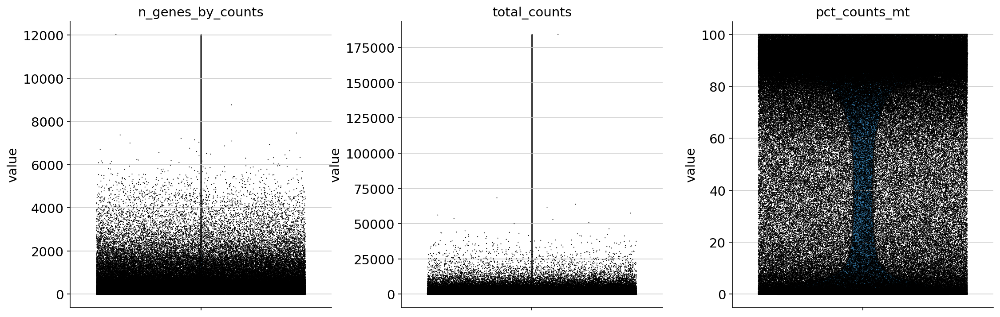

In [10]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

Text(0.5, 1.0, '% mt-genes across all cells-prefilter')

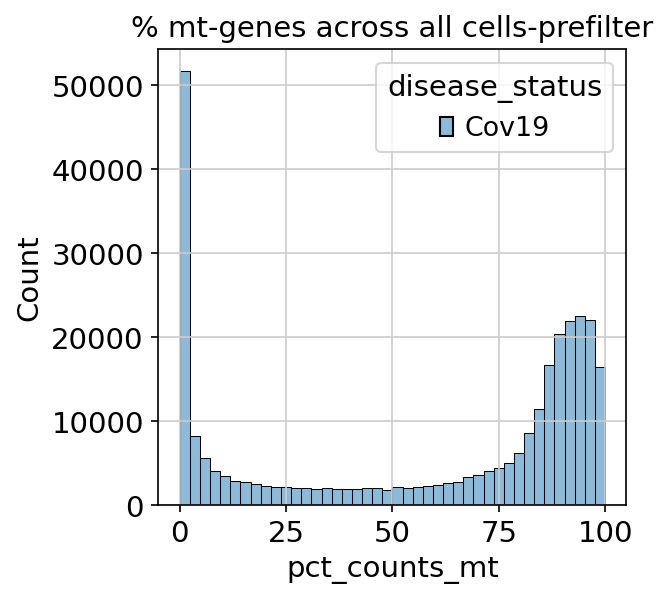

In [11]:
sns.histplot(data=adata.obs, x ='pct_counts_mt',hue='disease_status')
plt.title('% mt-genes across all cells-prefilter')
#plt.savefig(figure_directory + sample_name + '-hist_prefiltered_percent_mito-disease_status.pdf',bbox_inches = 'tight')

In [12]:
adata.obs['log_ncounts']  = np.log10(adata.obs.total_counts)
adata.obs['log_ngenes'] = np.log10(adata.obs['n_genes_by_counts'])

/data/alejandro/miniconda3/envs/scanpy/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [13]:
## freeze counts in layer
adata.layers["counts"] = adata.X.copy()

Text(0.5, 1.0, 'Library size-prefilter')

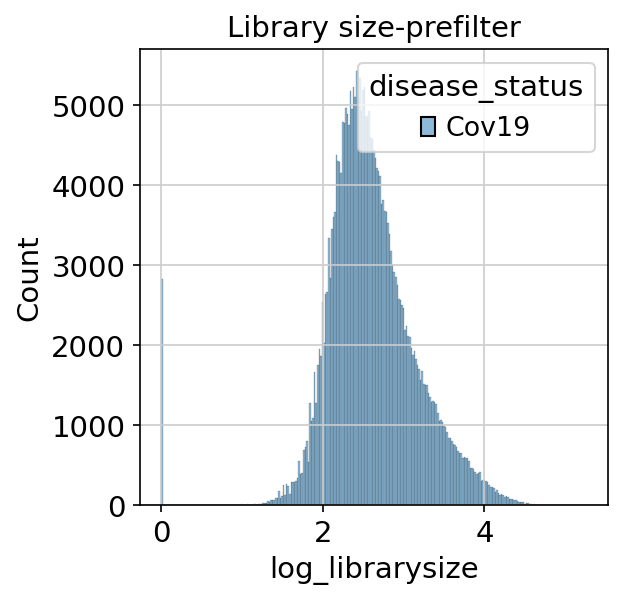

In [14]:
adata.obs['log_librarysize']  =np.log10(np.sum(adata.layers['counts'], axis =1) + 1)
sns.histplot(data=adata.obs, x='log_librarysize',hue='disease_status')
plt.title('Library size-prefilter')
#plt.savefig(figure_directory + sample_name + '-hist_prefiltered_library_size-disease-status.pdf',bbox_inches = 'tight')

### Perform filtering steps

We consider 3 different types of mitochondrial cut-offs: <br>
(Unless otherwise specified, we use the mode 'percent_mito' for all samples. <br><br>
'normal': Remove cells < 100 non-mt genes AND < 1000 non-mt gene counts <br>
'percent_mito': Remove cells < 100 non-mt genes AND < 1000 non-mt gene counts AND > 50% mitochondrial genes <br>
'remove_all_mito_genes': Remove cells < 100 non-mt genes AND < 1000 non-mt gene counts AND remove mitochondrial genes from downstream analysis

In [16]:
adata_unfiltered = adata

### Filter (remove cells < 500 n_counts and < 200 genes)

In [17]:
adata = utils.filter_adata( adata_unfiltered,min_n_counts=500, 
                           min_n_genes=200, filter='percent_mito',
                              mt_cutoff = 5, filter_max = 10000)

filtered out 2617 genes that are detected in less than 3 cells
filtered out 237919 cells that have less than 500 counts
filtered out 2388 cells that have more than 10000 counts
filtered out 2443 cells that have less than 200 genes expressed


Text(0.5, 1.0, '% mt-genes across all cells-filtered')

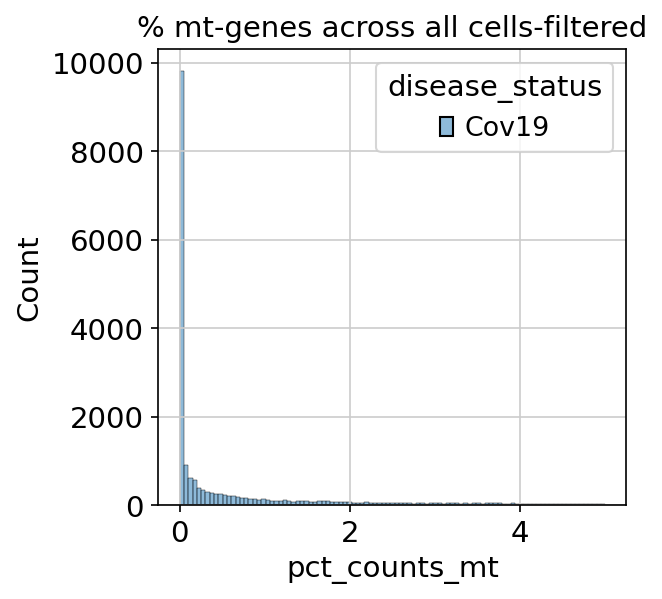

In [42]:
sns.histplot(data=adata.obs, x ='pct_counts_mt',hue='disease_status')
plt.title('% mt-genes across all cells-filtered')
#plt.savefig(figure_directory + sample_name + '-hist_filter_percent_mito-disease_status.pdf',bbox_inches = 'tight')

Trying to set attribute `.obs` of view, copying.


Text(0.5, 1.0, 'Library size-filtered')

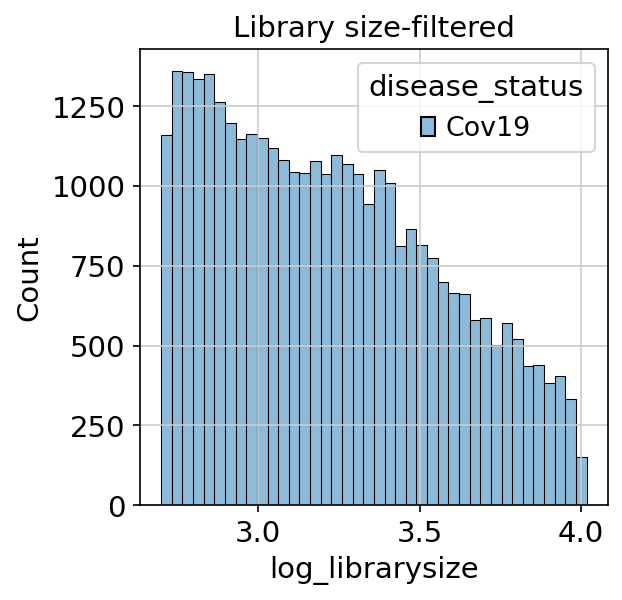

In [18]:
adata.obs['log_librarysize']  =np.log10(np.sum(adata.layers['counts'], axis =1))
sns.histplot(data=adata.obs, x='log_librarysize',hue='disease_status')
plt.title('Library size-filtered')
#plt.savefig(figure_directory + sample_name + '-hist_filter_library_size-disease-status.pdf',bbox_inches = 'tight')

In [20]:
adata

AnnData object with n_obs × n_vars = 35286 × 33567
    obs: '10X_run', 'disease_status', 'lab', 'tissue', 'Barcode', 'replicate', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log_ncounts', 'log_ngenes', 'log_librarysize'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'counts'

## Batch correction

### SCVI pre-processing and training

* Save raw counts in a separate layer
* Perform normalization with standard pipeline
* Prepare SCVI model 
* Train
* UMAP in new latent (batch-corrected) space

In [21]:
adata = utils.run_scvi(adata, n_layers=2, n_latent=64)

normalizing counts per cell
    finished (0:00:01)


INFO     Using batches from adata.obs["10X_run"]                                             
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["counts"]                                              
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 35116 cells, 33567 vars, 16       
         batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 0 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 228/228: 100%|██████████| 228/228 [40:04<00:00, 10.55s/it, loss=4.21e+03, v_num=1]


In [39]:
# optional: write intermediate step 
adata.write(data_directory + sample_name + "_scvi_no_neighbors.h5ad")

In [22]:
adata = utils.compute_neighbors(adata, use_rep='X_scVI')

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:41)
running Leiden clustering
    finished: found 18 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:17)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:40)


### Make SCVI-corrected UMAPs colored by patient source and disease status

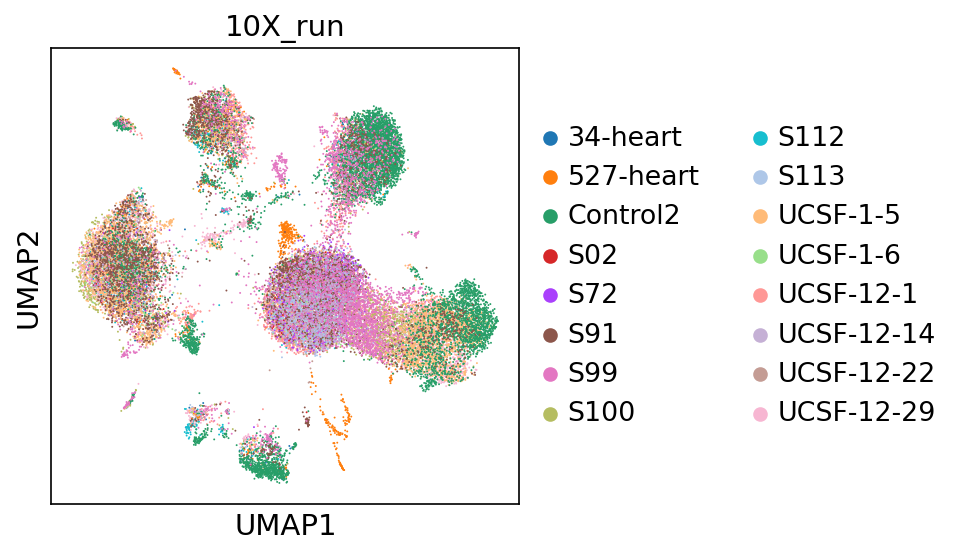

In [23]:
color_by ='10X_run'
sc.pl.umap(
    adata,
    color=[color_by]
)
#plt.savefig(figure_directory + sample_name + '-filtered_UMAP-scvi_disease-status.pdf',bbox_inches = 'tight')

### Save batch-corrected (SCVI) adata object

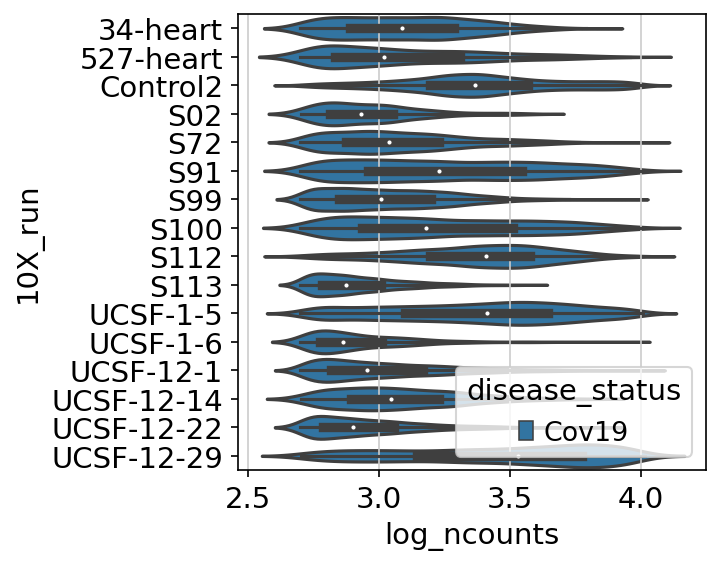

In [24]:
res = sns.violinplot(data =adata.obs, x= 'log_ncounts',y='10X_run', hue='disease_status')
#plt.savefig(figure_directory + sample_name + '-violin-plot-log-counts.pdf',bbox_inches = 'tight')

In [25]:
sc.tl.rank_genes_groups(adata, groupby = 'leiden', method = 'wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:02:34)


In [26]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(25)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,CNTNAP2,ST6GALNAC3,LAMA2,RYR2,DLC1,TTN,CD163,LDB2,MT-CYB,PTPRC,MACROD2,NEAT1,NRXN1,AGBL4,PKHD1L1,HBB,CRISPLD2,ARL15
1,CSMD1,LDB2,NEGR1,SLC8A1,EPS8,CMYA5,RBPJ,LINC02147,MT-ATP6,IKZF1,CALN1,PRG4,NRXN3,ANKRD7,PPFIBP1,HBA2,LPP,PTPRB
2,RBFOX1,PTPRM,DCN,MLIP,PRKG1,RYR2,FMN1,ST6GALNAC3,MT-ND3,ANKRD44,RUNX1,NDRG1,ANK3,NR6A1,MMRN1,HBA1,AKAP12,MEIS2
3,LRP1B,VWF,ABCA6,SORBS2,PLA2G5,MYBPC3,MRC1,PECAM1,MT-CO1,CHST11,AL691420.1,SAT1,XKR4,LINC01606,RALGAPA2,EPB41,TNC,SYNE2
4,PTPRD,TCF4,ABCA8,TTN,EGFLAM,ANKRD1,F13A1,SLCO2A1,MT-CO3,PARP8,AC011287.1,GFPT2,CDH19,LINC01572,TFPI,SLC4A1,FLNA,CHRM3
5,ROBO2,FLT1,ABCA9,PDE3A,NR2F2-AS1,MYH7,RBM47,CALCRL,MT-CO2,ARHGAP15,FAM155A,WWC1,CADM2,PPM1E,AKAP12,SLC25A37,SVIL,FLT1
6,MACROD2,ANO2,PID1,FGF12,FRMD3,DMD,ZEB2,PTPRB,TPM1,PIP4K2A,AL117329.1,NEDD4L,BCL2,TPTE,LRRC1,MARCH8,ACTG2,PLPP1
7,PCDH15,SYNE1,RORA,CTNNA3,CALD1,TNNT2,FRMD4B,VWF,MT-ND4,PRKCB,NRXN1,MALAT1,SORCS1,RUNX1,KALRN,RAPGEF2,TAGLN,DOCK4
8,EYS,PITPNC1,ABCA10,MYBPC3,GUCY1A2,LDB3,SLC9A9,EMCN,PDE3A,SKAP1,DLGAP2,C3,EHBP1,ANKRD30A,VAV3,TOP1,CALD1,ARHGEF3
9,NRXN3,BTNL9,CDH19,CACNA1C,MYO1B,MYOM1,FKBP5,FOXP1,PDLIM5,IQGAP2,AUTS2,CUX1,CHL1,DNAH14,NXN,TSPAN5,SORBS1,ETS1


In [34]:
louvain_degs = pd.DataFrame(adata.uns['rank_genes_groups']['names'])
#louvain_degs.to_csv(data_directory + '/' + sample_name + '-leiden-degs.csv')

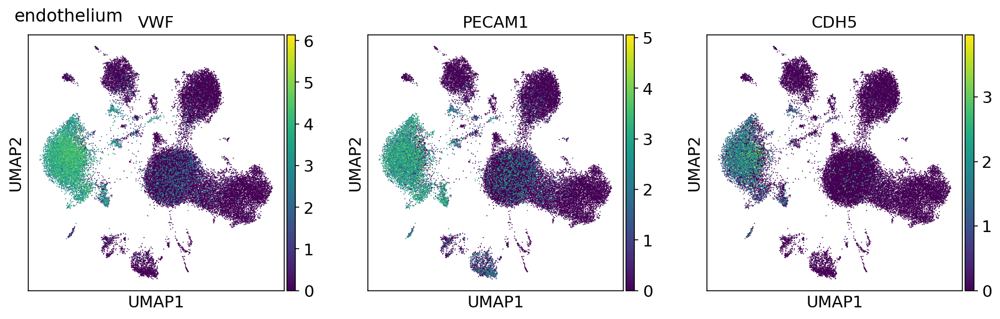

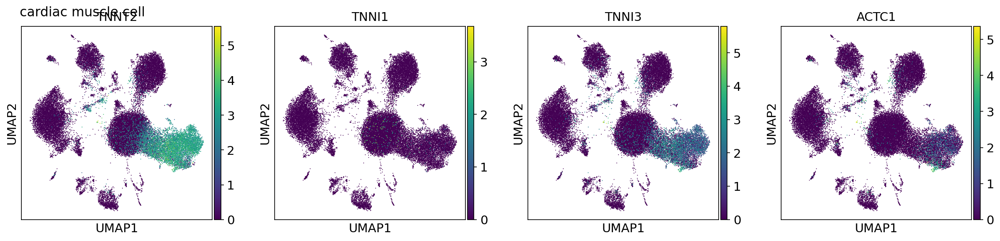

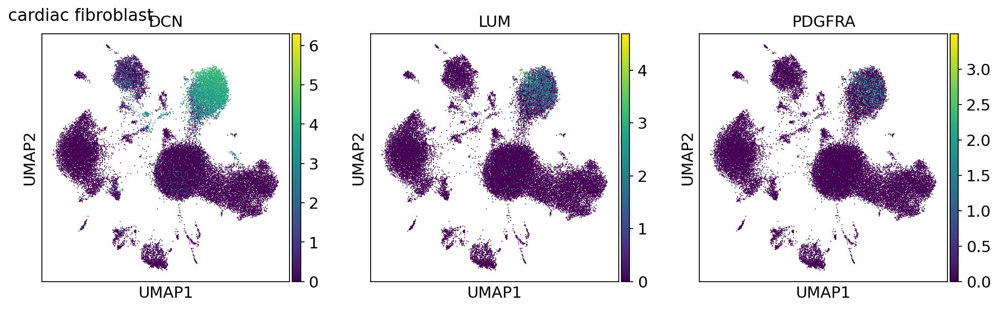

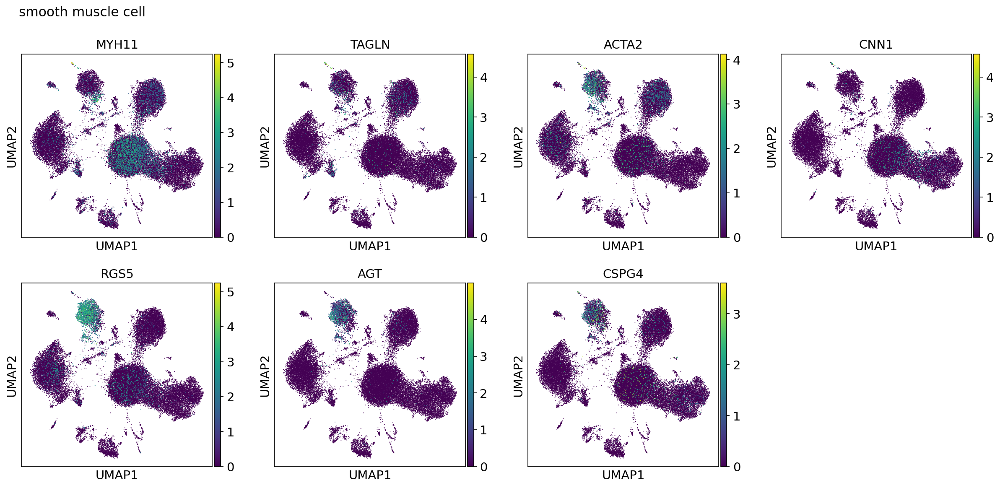

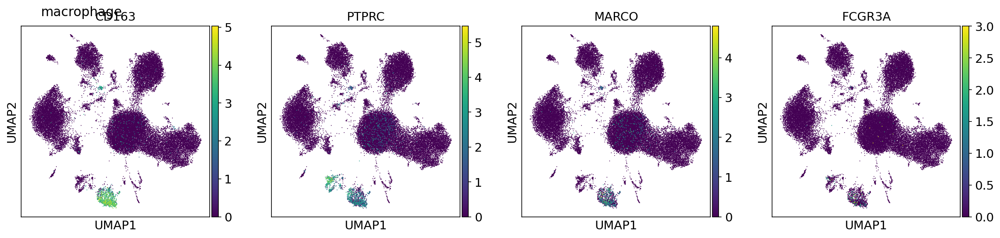

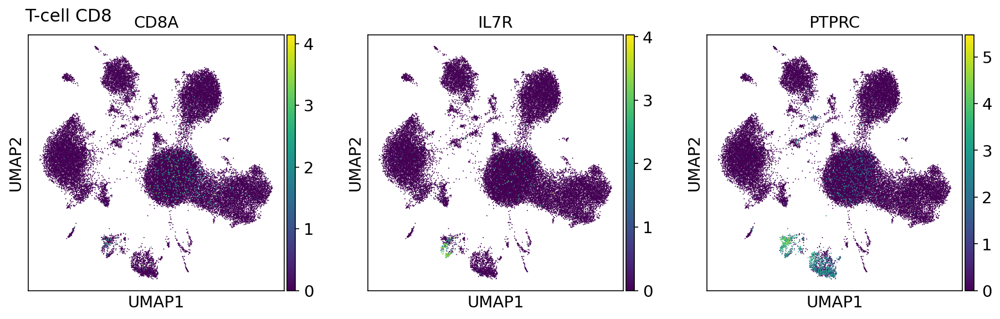

In [28]:
markers = utils.get_markers('heart')
for cell_type in markers:
    sc.pl.umap(adata,
          color =markers[cell_type], #[cell_type],
          return_fig = True)
    
    plt.suptitle(cell_type, x = 0.1, fontsize=15)
    #plt.savefig(data_directory + sample_name + '_UMAP-' + cell_type + '.pdf')

### Inspect for contamination
We found strong contamination from neuronal genes in our samples. NRXN1/3 are good markers to identify contamination. While some cells seem to actually be neruons (Cluster 12), the neuronal markers co-express with cell-type specific markers in other clusters. We therefore define these cells as potential doublets and procceded to remove them. 

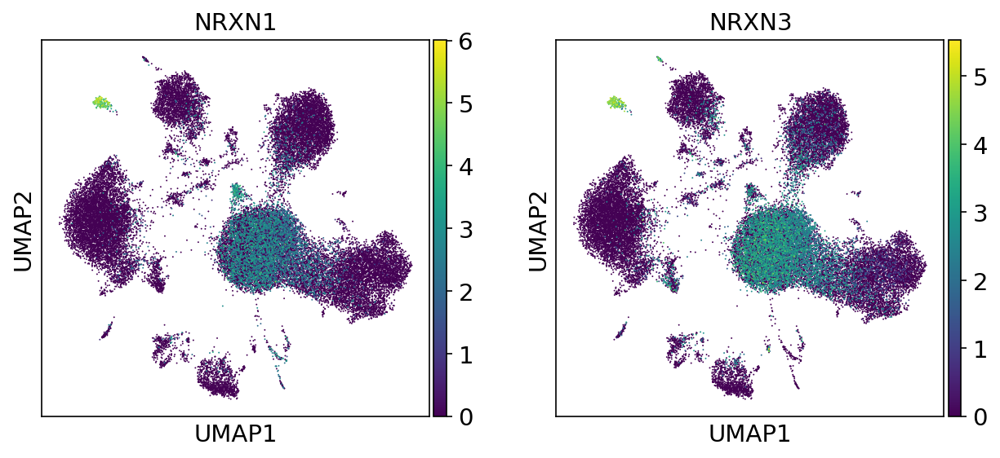

In [27]:
sc.pl.umap(adata, color=['NRXN1', 'NRXN3'])

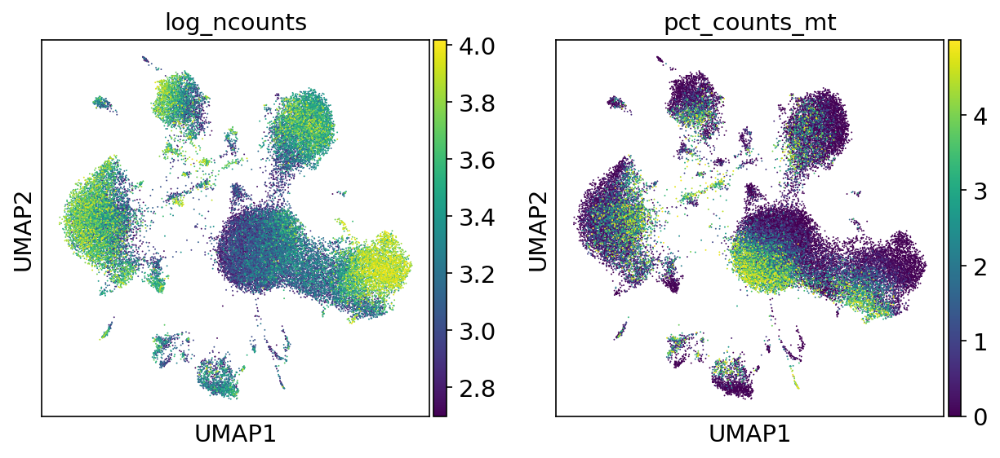

In [29]:
sc.pl.umap(adata, color=['log_ncounts','pct_counts_mt'])

In [33]:
n_cells = adata.X.shape[0]
n_cells

35116

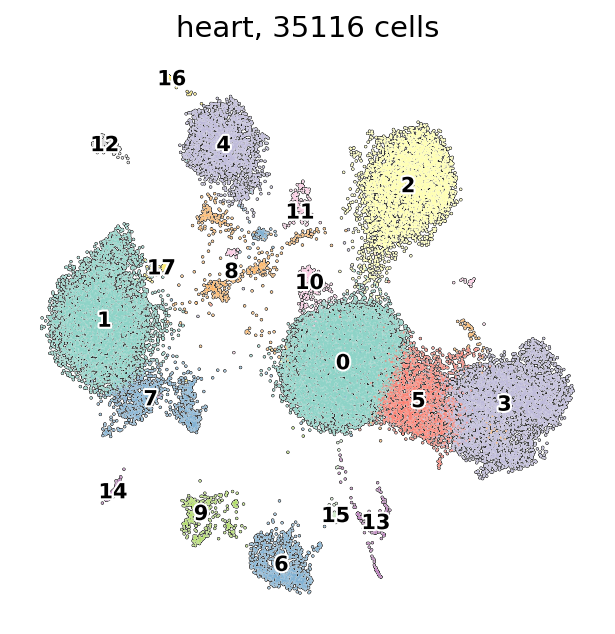

In [34]:
from matplotlib.pyplot import rc_context
tissue = sample.split('/')[0]
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(adata, color='leiden', add_outline=True, legend_loc='on data',
               legend_fontsize=10, legend_fontoutline=2,frameon=False,
               title= f'{tissue}, {n_cells} cells', palette='Set3')

         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:46)
Storing dendrogram info using `.uns['dendrogram_leiden']`


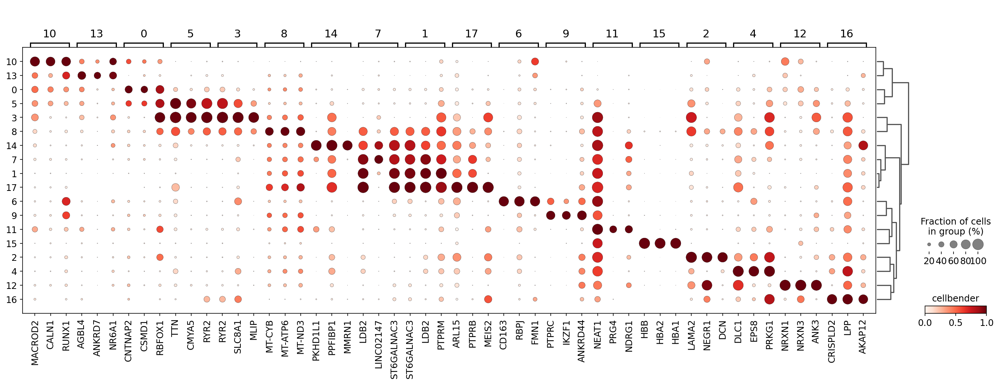

In [32]:
sc.pl.rank_genes_groups_dotplot(adata,n_genes=3, standard_scale='var', colorbar_title='cellbender')

categories: 0, 1, 2, etc.
var_group_labels: endothelium, cardiac muscle cell, cardiac fibroblast, etc.


{'mainplot_ax': <AxesSubplot:>,
 'group_extra_ax': <AxesSubplot:>,
 'gene_group_ax': <AxesSubplot:>,
 'size_legend_ax': <AxesSubplot:title={'center':'Fraction of cells\nin group (%)'}>,
 'color_legend_ax': <AxesSubplot:title={'center':'cellbender'}>}

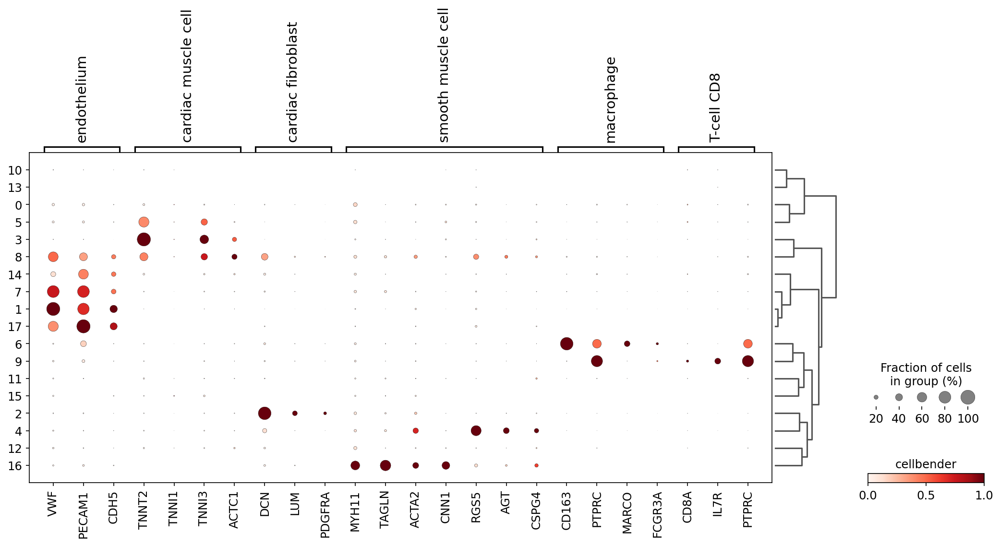

In [37]:

fig, (ax1) = plt.subplots(1, 1, figsize=(17,7), gridspec_kw={'wspace':0.9})

sc.pl.dotplot(adata, 
              var_names= markers, 
              layer='counts',
              groupby='leiden',
              log=True,
              standard_scale='var',
              colorbar_title = 'cellbender',
              dendrogram=True, ax = ax1, show = False)

## Remove doublets and contaminated cell types
Based on marker expression we can identify some clusters as contaminated (potential doublets). We also identified contamination of neuronal gene markers in clusters 0, 5, 16. Since these clusters show high expression of neuronal markers and no specific heart cell type markers --which prevents us from confidently annotating them-- we decided them to remove them. 

In [38]:
contaminated_clusters = ['0','5','10','16','13']
adata = adata[~adata.obs['leiden'].isin(contaminated_clusters),:]

In [39]:
adata

View of AnnData object with n_obs × n_vars = 22772 × 33567
    obs: '10X_run', 'disease_status', 'lab', 'tissue', 'Barcode', 'replicate', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log_ncounts', 'log_ngenes', 'log_librarysize', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p', '_scvi', 'neighbors', 'leiden', 'umap', '10X_run_colors', 'rank_genes_groups', 'leiden_colors', 'dendrogram_leiden'
    obsm: 'X_scVI', 'X_umap', 'X_pca'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

In [41]:
# copy raw-counts on adata.X before running SCVI again 
adata.X = adata.layers['counts'].copy() 

### Run scvi again after cleaning up the object
We re-cluster the data and generate a new UMAP after removing the contaminated cells. The new UMAP structure should not be as affected by the contamination anymore. Though for some organs, it might be necessary to perform additional rounds of cleaning<br> 

In [42]:
adata = utils.run_scvi(adata, n_layers=2, n_latent=64)

/data/alejandro/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
normalizing counts per cell
    finished (0:00:00)


INFO     Using batches from adata.obs["10X_run"]                                             
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["counts"]                                              
INFO     Computing library size prior per batch                                              
INFO     Successfully registered anndata object containing 22323 cells, 33567 vars, 11       
         batches, 1 labels, and 0 proteins. Also registered 0 extra categorical covariates   
         and 0 extra continuous covariates.                                                  
INFO     Please do not further modify adata until model is trained.                          


GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 358/358: 100%|██████████| 358/358 [35:59<00:00,  6.03s/it, loss=4.6e+03, v_num=1] 


In [44]:
adata = utils.compute_neighbors(adata, use_rep='X_scVI')

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
running Leiden clustering
    finished: found 18 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:13)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:21)


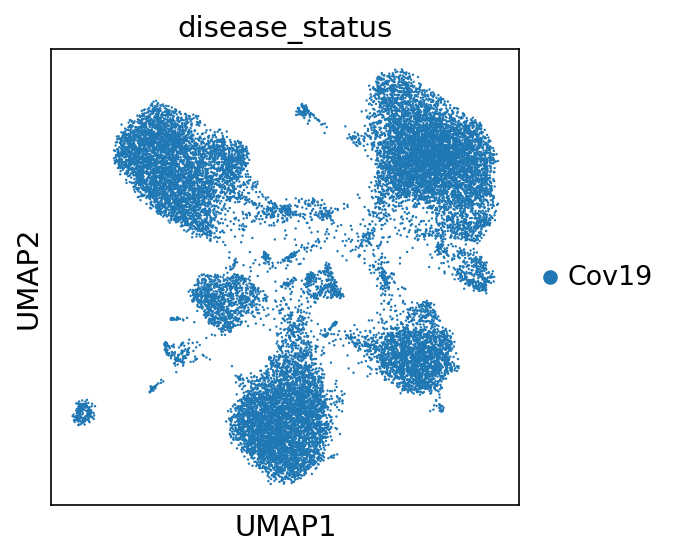

In [45]:
sc.pl.umap(adata, color='disease_status')

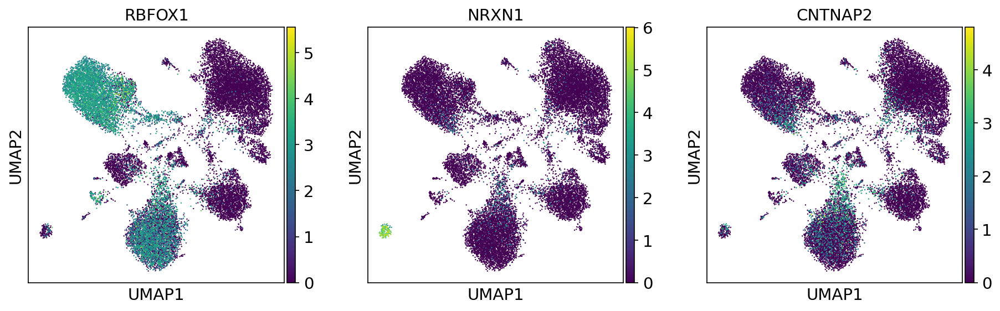

In [46]:
# contaminating genes 
sc.pl.umap(adata, color=['RBFOX1', 'NRXN1', 'CNTNAP2'])

### Remove doublets
Compute doublet scores

In [63]:
test_dat = adata.copy()
test_dat.X = adata.layers['counts']

In [64]:
sc.external.pp.scrublet(test_dat)

Running Scrublet
filtered out 5290 genes that are detected in less than 3 cells
normalizing counts per cell
    finished (0:00:00)
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
/data/alejandro/miniconda3/envs/scanpy/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)
Embedding transcriptomes using PCA...
    Scrublet finished (0:00:57)


Automatically set threshold at doublet score = 0.36
Detected doublet rate = 0.6%
Estimated detectable doublet fraction = 58.4%
Overall doublet rate:
	Expected   = 5.0%
	Estimated  = 1.1%


(<Figure size 1200x450 with 2 Axes>,
 array([<AxesSubplot:title={'center':'Observed transcriptomes'}, xlabel='Doublet score', ylabel='Prob. density'>,
        <AxesSubplot:title={'center':'Simulated doublets'}, xlabel='Doublet score', ylabel='Prob. density'>],
       dtype=object))

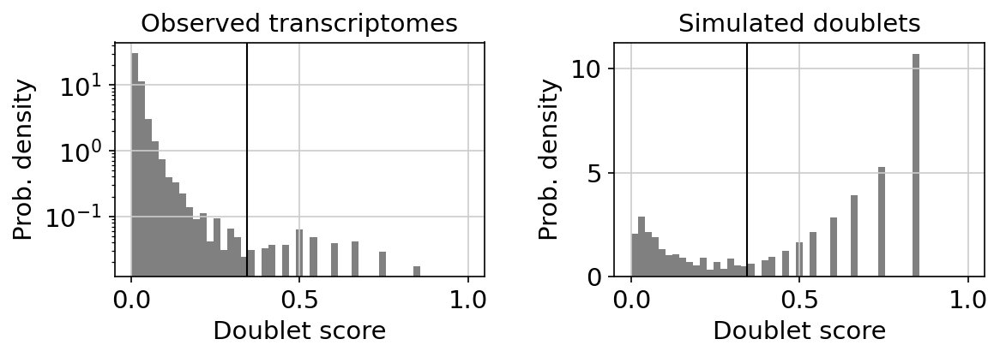

In [66]:
sc.external.pl.scrublet_score_distribution(adata)

In [67]:
adata.obs['doublet_score'] = test_dat.obs['doublet_score']
adata.obs['predicted_doublet'] = test_dat.obs['predicted_doublet'].astype(str)

In [68]:
del test_dat

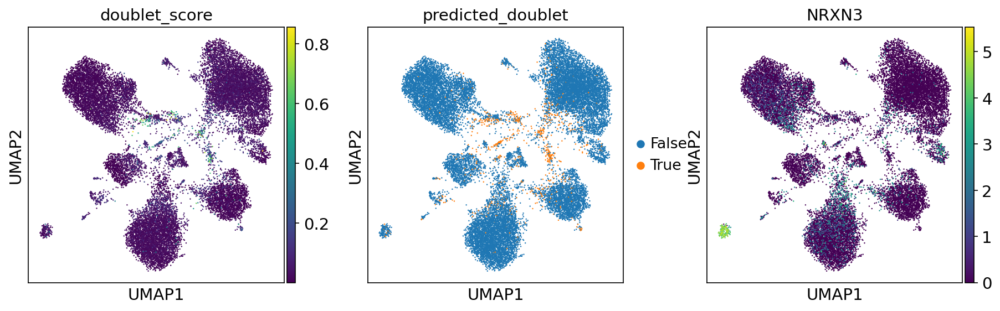

In [74]:
doublets = adata.obs['doublet_score'] > 0.1
adata.obs['predicted_doublet'][doublets] = 'True'
sc.pl.umap(adata, 
          color =['doublet_score','predicted_doublet','NRXN3'])

In [75]:
adata.obs['predicted_doublet'].value_counts()

False    21504
True       819
Name: predicted_doublet, dtype: int64

In [76]:
adata = adata[adata.obs['predicted_doublet'] == 'False']

## Revisit gene expression

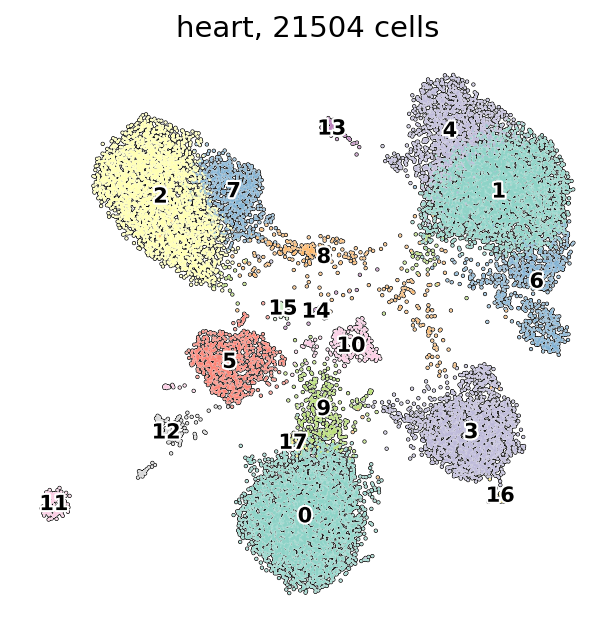

In [78]:
from matplotlib.pyplot import rc_context
tissue = sample.split('/')[0]
n_cells = adata.X.shape[0]
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(adata, color='leiden', add_outline=True, legend_loc='on data',
               legend_fontsize=10, legend_fontoutline=2,frameon=False,
               title= f'{tissue}, {n_cells} cells', palette='Set3')

### Save intermediate object

In [80]:
tissue_objects_path= '/mnt/ibm_lg/covid_tissue_atlas/data/tissue_objects'
adata.write(f'{tissue_objects_path}/{tissue}_cellbender_scvi.h5ad')

In [81]:
adata = sc.read_h5ad(f'{tissue_objects_path}/{tissue}_cellbender_scvi.h5ad')

In [82]:
adata.obs.head()

,10X_run,disease_status,lab,tissue,Barcode,replicate,batch,n_genes_by_counts,total_counts,total_counts_mt,...,log_ncounts,log_ngenes,log_librarysize,_scvi_batch,_scvi_labels,_scvi_local_l_mean,_scvi_local_l_var,leiden,doublet_score,predicted_doublet
34-heart_CATCCACTCTTTGCTA-1,34-heart,Cov19,34-heart,heart,CATCCACTCTTTGCTA-1,1,0,2948,6181.0,24.0,...,3.791059,3.469527,3.791059,0,0,7.142946,0.32016,8,0.029669,False
34-heart_CTACCTGAGTTGCATC-1,34-heart,Cov19,34-heart,heart,CTACCTGAGTTGCATC-1,1,0,2479,4947.0,0.0,...,3.694342,3.394277,3.694342,0,0,7.142946,0.32016,0,0.036532,False
34-heart_ATACTTCGTACGAAAT-1,34-heart,Cov19,34-heart,heart,ATACTTCGTACGAAAT-1,1,0,2331,4640.0,0.0,...,3.666518,3.367542,3.666518,0,0,7.142946,0.32016,0,0.024144,False
34-heart_ATACTTCGTTATTCCT-1,34-heart,Cov19,34-heart,heart,ATACTTCGTTATTCCT-1,1,0,2288,4537.0,0.0,...,3.656769,3.359456,3.656769,0,0,7.142946,0.32016,4,0.016994,False
34-heart_CATCCACCAGATCCTA-1,34-heart,Cov19,34-heart,heart,CATCCACCAGATCCTA-1,1,0,2207,4434.0,0.0,...,3.646796,3.343802,3.646796,0,0,7.142946,0.32016,3,0.006465,False


# Integrate tissue expert annotations

In [7]:
tissue_objects_path= '/mnt/ibm_lg/covid_tissue_atlas/data/tissue_objects'

sn_adata = sc.read_h5ad(f"{tissue_objects_path}/{tissue}_cellbender_scvi.h5ad")

In [8]:
biohub_heart_path = '/mnt/ibm_lg/alejandro/covid-tissue-atlas/annotated_objects/tidy_objects/heart_0727.h5ad'
ann_data = sc.read_h5ad( biohub_heart_path )

In [9]:
ann_data.obs['lab2'] = [g.split("_")[1] for g in ann_data.obs['10X_run']]
ann_data.obs['lab2'].value_counts()

2        6859
1-5      5036
12-29    3240
S91      2311
S100     2031
S99      1617
12-1     1392
S112     1076
S113      648
527       586
34        549
12-22     530
S72       444
S02       395
Name: lab2, dtype: int64

In [10]:
sn_adata.obs['lab'].value_counts()

Control2      6363
UCSF-1-5      4290
UCSF-12-29    2691
S91           2204
S100          1516
S99           1323
UCSF-12-1     1117
S112           768
34-heart       571
527-heart      414
UCSF-12-22     247
Name: lab, dtype: int64

In [11]:
ann_data.obs['lab3']=ann_data.obs['lab2'].copy() 
ann_data.obs['lab3']=ann_data.obs['lab2'].astype(str)

ann_data.obs['lab3'][ann_data.obs['lab2']=='2'] = 'Control2'
ann_data.obs['lab3'][ann_data.obs['lab2']=='1-5'] = 'UCSF-1-5'
ann_data.obs['lab3'][ann_data.obs['lab2']=='12-29'] = 'UCSF-12-29'
ann_data.obs['lab3'][ann_data.obs['lab2']=='12-1'] = 'UCSF-12-1'
ann_data.obs['lab3'][ann_data.obs['lab2']=='12-22'] = 'UCSF-12-22'

ann_data.obs['lab3'][ann_data.obs['lab2']=='34'] = '34-heart'
ann_data.obs['lab3'][ann_data.obs['lab2']=='527'] = '527-heart'

<ipython-input-11-d16292416e25>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ann_data.obs['lab3'][ann_data.obs['lab2']=='2'] = 'Control2'
<ipython-input-11-d16292416e25>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ann_data.obs['lab3'][ann_data.obs['lab2']=='1-5'] = 'UCSF-1-5'
<ipython-input-11-d16292416e25>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ann_data.obs['lab3'][ann_data.obs['lab2']=='12-29'] = 'UCSF-12-29'
<ipyt

In [12]:
sn_adata.obs['cell_id_match'] = sn_adata.obs['lab'].astype(str) + '_' + sn_adata.obs['Barcode'].astype(str)
ann_data.obs['cell_id_match'] = ann_data.obs['lab3'].astype(str) + '_' +ann_data.obs['Barcode'].astype(str)

In [13]:
sn_adata.obs['lab'].value_counts()

Control2      6363
UCSF-1-5      4290
UCSF-12-29    2691
S91           2204
S100          1516
S99           1323
UCSF-12-1     1117
S112           768
34-heart       571
527-heart      414
UCSF-12-22     247
Name: lab, dtype: int64

In [14]:
ann_data.obs['lab3'].value_counts() 

Control2      6859
UCSF-1-5      5036
UCSF-12-29    3240
S91           2311
S100          2031
S99           1617
UCSF-12-1     1392
S112          1076
S113           648
527-heart      586
34-heart       549
UCSF-12-22     530
S72            444
S02            395
Name: lab3, dtype: int64

In [31]:
meta_ann = ann_data.obs
meta_ann.set_index('cell_id_match',inplace = True, drop=False)

In [32]:
common_cells = sn_adata.obs['cell_id_match'][sn_adata.obs['cell_id_match'].isin(meta_ann['cell_id_match'])]

In [33]:
not_found_cells = sn_adata.obs['cell_id_match'][~sn_adata.obs['cell_id_match'].isin(meta_ann['cell_id_match'])]

In [34]:
not_found_ann = meta_ann['cell_id_match'][~meta_ann['cell_id_match'].isin(sn_adata.obs['cell_id_match'])]

In [35]:
meta_ann.loc[common_cells].annotations_v1

cell_id_match
34-heart_CATCCACTCTTTGCTA-1               doublet
34-heart_CTACCTGAGTTGCATC-1    cardiac fibroblast
34-heart_ATACTTCGTACGAAAT-1    cardiac fibroblast
34-heart_ATACTTCGTTATTCCT-1           endothelial
34-heart_CATCCACCAGATCCTA-1      pericyte (ABCC9)
                                      ...        
S99_CCTCATGGTACGAGCA-1         cardiac fibroblast
S99_TATCTGTCAGTCGGAA-1           pericyte (ABCC9)
S99_TCGATTTAGCGATGCA-1           pericyte (ABCC9)
S99_TGCGATAGTCCAGCAC-1           pericyte (ABCC9)
S99_TCATGTTAGGGACAGG-1           pericyte (ABCC9)
Name: annotations_v1, Length: 17076, dtype: category
Categories (10, object): ['cardiac fibroblast', 'cardiac muscle cell', 'doublet', 'endothelial', ..., 'other immune (CD8 T-cell or monocyte)', 'pericyte (ABCC9)', 'smooth muscle cell (no ABCC9)', 'unassigned']

In [36]:
sn_adata.obs['annotations_v1'] = "unassigned"

In [37]:
sn_adata.obs['annotations_v1'] = meta_ann.loc[common_cells]['annotations_v1'].astype(str)

In [38]:
sn_adata.obs['annotations_v1'].value_counts() 

endothelial                              5621
cardiac muscle cell                      4344
cardiac fibroblast                       4040
pericyte (ABCC9)                         1527
macrophage                                647
unassigned                                323
smooth muscle cell (no ABCC9)             218
doublet                                   160
other immune (CD8 T-cell or monocyte)     126
neuron                                     70
Name: annotations_v1, dtype: int64

... storing 'annotations_v1' as categorical


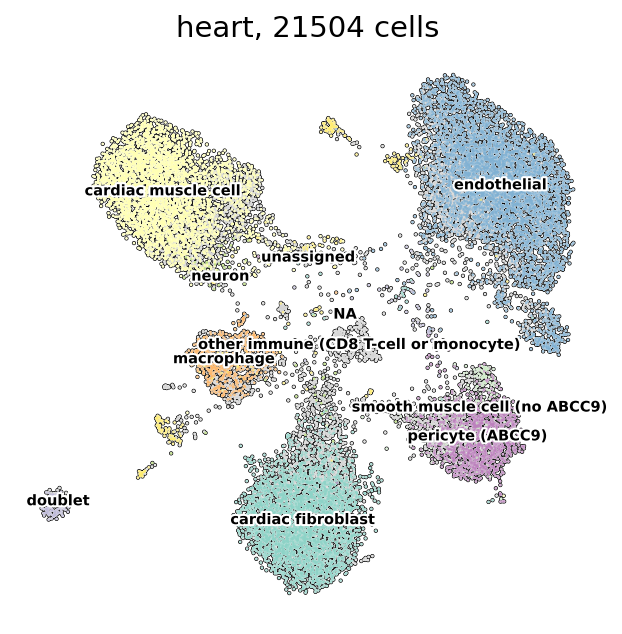

In [39]:
from matplotlib.pyplot import rc_context

with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(sn_adata, color='annotations_v1', add_outline=True, legend_loc='on data',
               legend_fontsize=7, legend_fontoutline=2,frameon=False,
               title= f'{tissue}, {sn_adata.X.shape[0]} cells', palette='Set3')

Based on tissue-expert annotations, we remove the remaining doublets, neurons and unassigned cells (expert was not able to assign a cell type, probably because of low quality of contamination)

In [40]:
sn_adata = sn_adata[~sn_adata.obs['annotations_v1'].isin(['unassigned', 'neuron']),:]

In [41]:
sn_adata

View of AnnData object with n_obs × n_vars = 21111 × 33567
    obs: '10X_run', 'disease_status', 'lab', 'tissue', 'Barcode', 'replicate', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log_ncounts', 'log_ngenes', 'log_librarysize', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden', 'doublet_score', 'predicted_doublet', 'cell_id_match', 'annotations_v1'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: '10X_run_colors', '_scvi', 'dendrogram_leiden', 'disease_status_colors', 'leiden', 'leiden_colors', 'neighbors', 'predicted_doublet_colors', 'rank_genes_groups', 'scrublet', 'umap', 'annotations_v1_colors'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

Cluster 8 is composed of mostly unassigned cells. 

In [42]:
sn_adata = sn_adata[~sn_adata.obs['leiden'].isin(['8']),:]

Trying to set attribute `.uns` of view, copying.


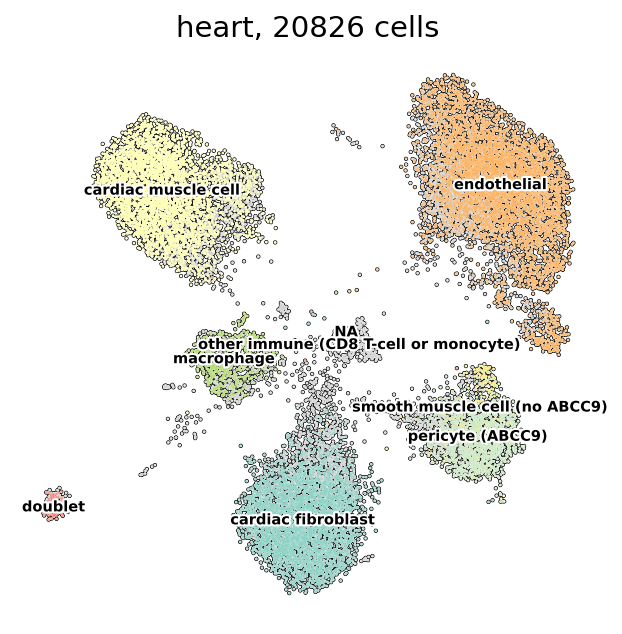

In [43]:
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(sn_adata, color='annotations_v1', add_outline=True, legend_loc='on data',
               legend_fontsize=7, legend_fontoutline=2,frameon=False,
               title= f'{tissue}, {sn_adata.X.shape[0]} cells', palette='Set3')

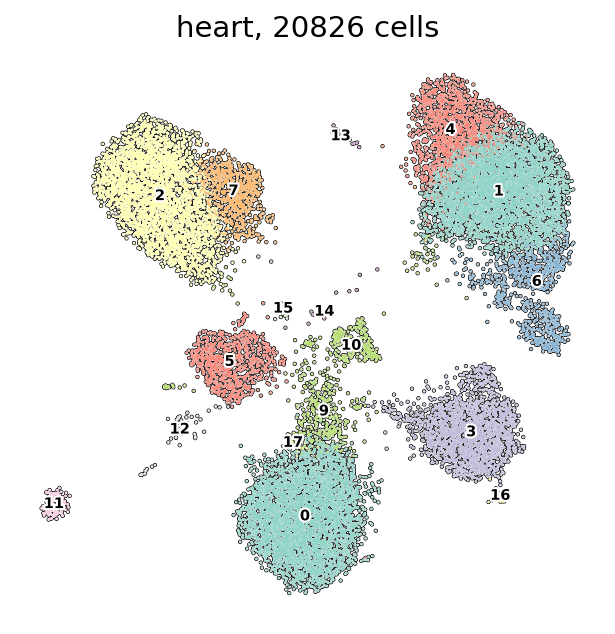

In [44]:
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(sn_adata, color='leiden', add_outline=True, legend_loc='on data',
               legend_fontsize=7, legend_fontoutline=2,frameon=False,
               title= f'{tissue}, {sn_adata.X.shape[0]} cells', palette='Set3')

In [ ]:
sn_adata[sn_adata.obs['annotations_v1'].isna()].obs.head()

In [100]:
sn_adata.obs.disease_status=sn_adata.obs.disease_status.astype(str)
sn_adata.obs.disease_status[sn_adata.obs.lab=='Control2'] = "Control"

<ipython-input-100-3dab244372ce>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sn_adata.obs.disease_status[sn_adata.obs.lab=='Control2'] = "Control"


... storing 'annotations_v2' as categorical


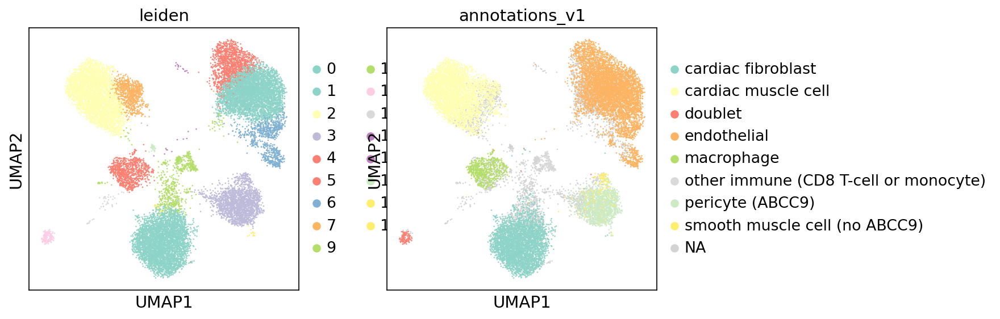

In [47]:
sc.pl.umap(sn_adata,
          color = ['leiden','annotations_v1'])

In [48]:
sn_adata.obs['annotations_v2'] = sn_adata.obs['annotations_v1'].astype(str)

In [49]:
sn_adata.obs.loc[sn_adata.obs['leiden'].isin(['2','7']),'annotations_v2'] = 'cardiac muscle cell'
sn_adata.obs.loc[sn_adata.obs['leiden'].isin(['4','1','6']),'annotations_v2'] = 'endothelial'
sn_adata.obs.loc[sn_adata.obs['leiden'].isin(['5']),'annotations_v2'] = 'macrophage'
sn_adata.obs.loc[sn_adata.obs['leiden'].isin(['11']),'annotations_v2'] = 'neurons'
sn_adata.obs.loc[sn_adata.obs['leiden'].isin(['0','9']),'annotations_v2'] = 'cardiac fibroblast'




... storing 'annotations_v2' as categorical


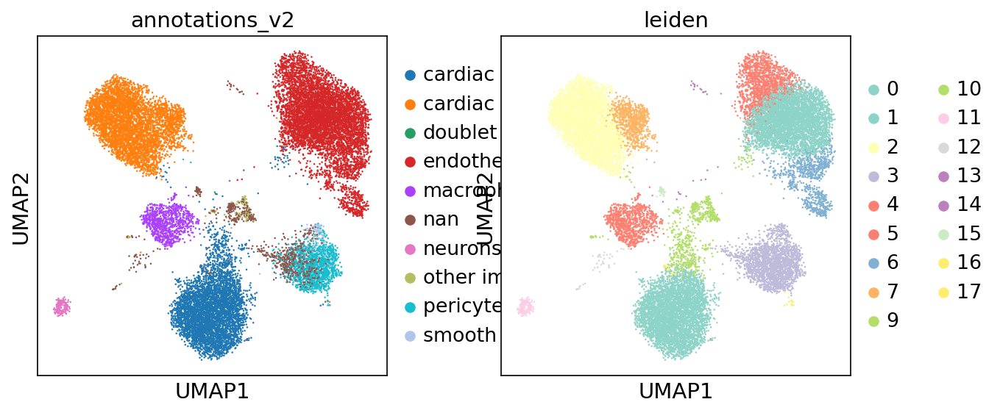

In [50]:
sc.pl.umap(sn_adata, 
          color=['annotations_v2', 'leiden'])

Sub-cluster leiden 3 to annotate Pericyte correctly 

In [52]:
orig_key = 'leiden'
new_key = 'leiden_psub'
new_rg_key = 'rg_psub'
sub_key = '3'

running Leiden clustering
    finished: found 19 clusters and added
    'leiden_psub', the cluster labels (adata.obs, categorical) (0:00:00)


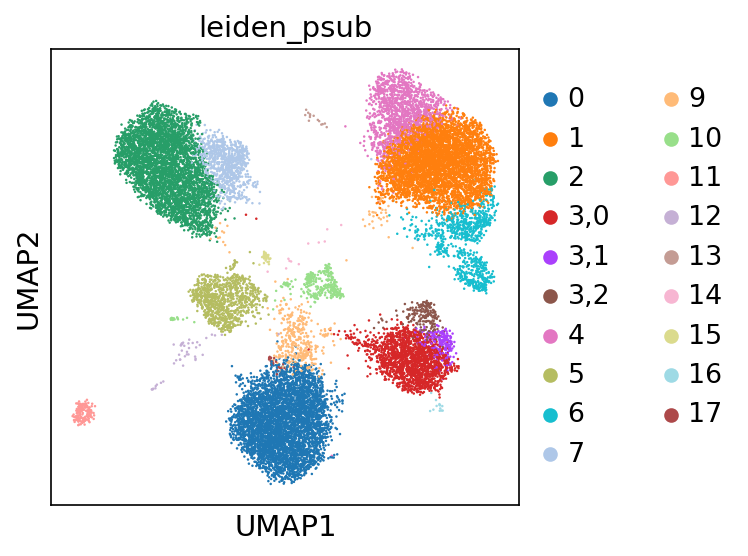

1      4726
0      4723
2      4134
3,0    1824
4      1368
5       916
6       877
7       817
9       405
10      316
3,1     225
3,2     192
11      158
12       44
15       39
17       24
13       14
16       13
14       11
Name: leiden_psub, dtype: int64

In [54]:
res = 0.3
sc.tl.leiden(sn_adata, restrict_to=(orig_key, [sub_key]), key_added=new_key, resolution=res)
sc.pl.umap(sn_adata, color=new_key)

In [56]:
# rename clusters based on expernt annotations
sn_adata.obs.loc[sn_adata.obs['leiden_psub'].isin(['3,0','3,1']),'annotations_v2'] = 'pericyte (ABCC9)'
sn_adata.obs.loc[sn_adata.obs['leiden_psub'].isin(['3,2']),'annotations_v2'] = 'smooth muscle cell (no ABCC9)'


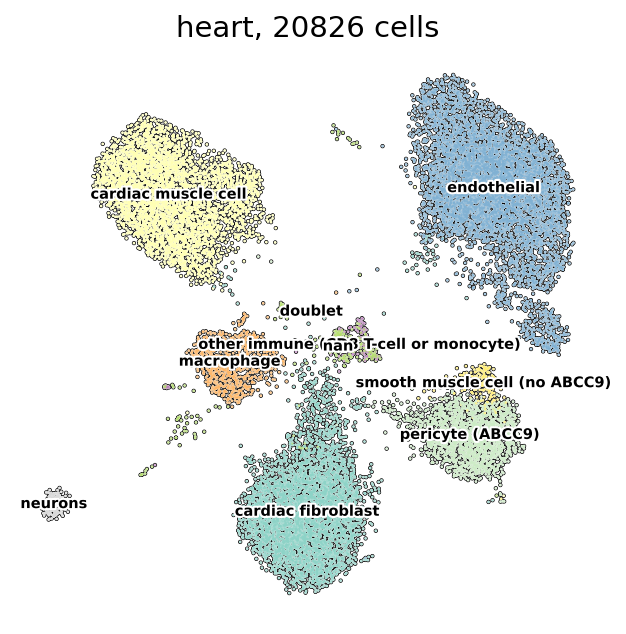

In [58]:
with rc_context({'figure.figsize': (5, 5)}):
    sc.pl.umap(sn_adata, color='annotations_v2', add_outline=True, legend_loc='on data',
               legend_fontsize=7, legend_fontoutline=2,frameon=False,
               title= f'{tissue}, {sn_adata.X.shape[0]} cells', palette='Set3')

### Object summary
Annotations look good. Remove remaining cells with no annotation

In [60]:
sn_adata = sn_adata[~sn_adata.obs['annotations_v2'].isin(['doublet', 'nan']),:]

In [61]:
sn_adata.obs.annotations_v2.value_counts()

endothelial                              6975
cardiac fibroblast                       5152
cardiac muscle cell                      4953
pericyte (ABCC9)                         2057
macrophage                                917
smooth muscle cell (no ABCC9)             193
neurons                                   158
other immune (CD8 T-cell or monocyte)     124
Name: annotations_v2, dtype: int64

In [76]:
sn_adata.obs.disease_status = sn_adata.obs.disease_status.astype(str)
sn_adata.obs.disease_status[sn_adata.obs.lab=='Control2'] = "Control"

Trying to set attribute `.obs` of view, copying.
<ipython-input-76-cf1e1b9cc077>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sn_adata.obs.disease_status[sn_adata.obs.lab=='Control2'] = "Control"


In [77]:
cell_type_counts = sn_adata.obs.groupby(by=['annotations_v2','disease_status']).count()['leiden_psub'].reset_index()

In [78]:
cell_type_counts['log_n_cells'] = np.log10(cell_type_counts['leiden_psub'])

In [79]:
cell_type_counts

,annotations_v2,disease_status,leiden_psub,log_n_cells
0,cardiac fibroblast,Control,2711,3.433130
1,cardiac fibroblast,Cov19,2441,3.387568
2,cardiac muscle cell,Control,1682,3.225826
3,cardiac muscle cell,Cov19,3271,3.514681
4,endothelial,Control,735,2.866287
5,endothelial,Cov19,6240,3.795185
6,macrophage,Control,644,2.808886
7,macrophage,Cov19,273,2.436163
8,neurons,Control,85,1.929419
9,neurons,Cov19,73,1.863323


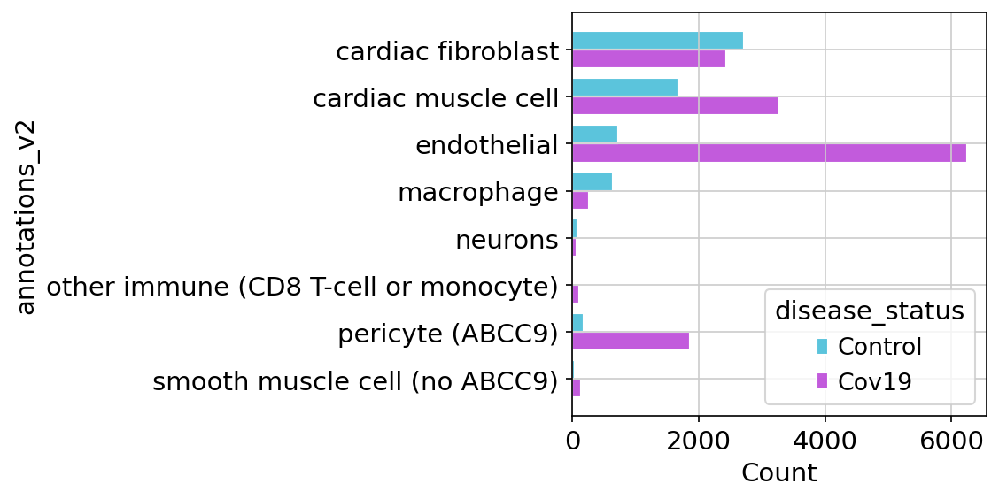

In [80]:
import seaborn as sns

ax = sns.histplot(
    cell_type_counts,
    y='annotations_v2',
    # Use the value variable here to turn histogram counts into weighted
    # values.
    weights='leiden_psub',
    hue='disease_status',
    multiple='dodge',
    palette=['#24b1d1', '#ae24d1'],
    # Add white borders to the bars.
    edgecolor='white',
    # Shrink the bars a bit so they don't touch.
    shrink=0.8
)

... storing 'disease_status' as categorical


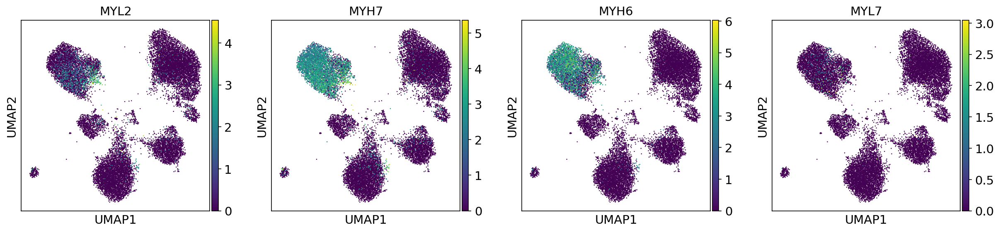

In [81]:
#subset cardiomyocyte
sc.pl.umap(sn_adata,
          color = ['MYL2','MYH7','MYH6','MYL7'])

### Save final object 

In [82]:
sn_adata.write('/mnt/ibm_lg/covid_tissue_atlas/data/tissue_objects/heart/heart_cellbender_scvi.h5ad')

In [83]:
adata = sc.read_h5ad('/mnt/ibm_lg/covid_tissue_atlas/data/tissue_objects/heart/heart_cellbender_scvi.h5ad') 

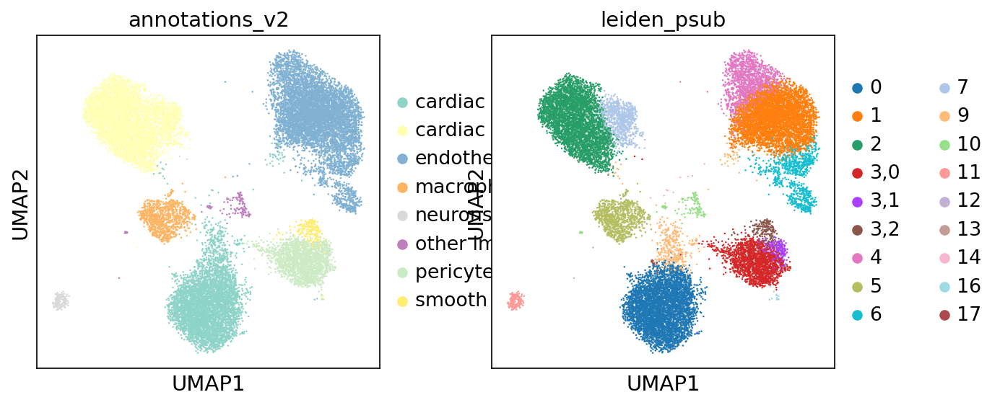

In [86]:
sc.pl.umap(adata, color =['annotations_v2','leiden_psub'])

Rename the obs so they match the other objects

In [87]:
adata.obs['leiden'] = adata.obs['leiden_psub'].copy() 

In [88]:
adata.obs['annotations_v1'] = adata.obs['annotations_v2'].copy() 

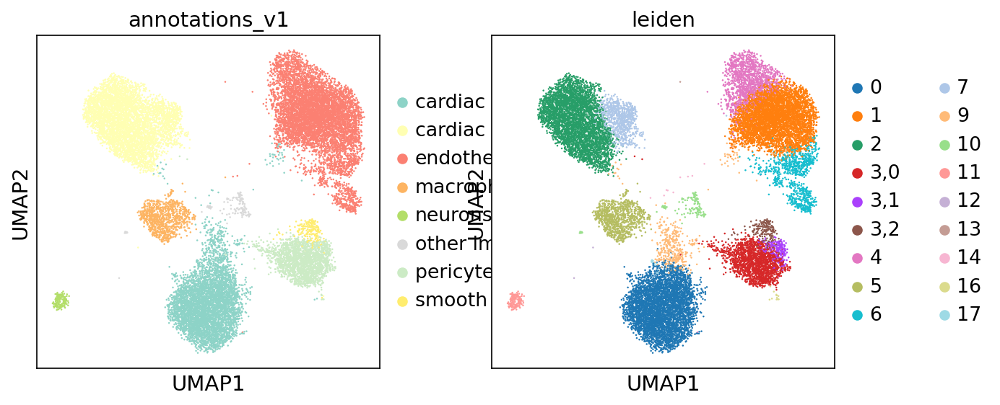

In [89]:
sc.pl.umap(adata, color =['annotations_v1','leiden'])

In [91]:
adata.write('/mnt/ibm_lg/covid_tissue_atlas/data/tissue_objects/heart/heart_cellbender_scvi.h5ad')

In [93]:
adata

AnnData object with n_obs × n_vars = 20529 × 33567
    obs: '10X_run', 'disease_status', 'lab', 'tissue', 'Barcode', 'replicate', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'log_ncounts', 'log_ngenes', 'log_librarysize', '_scvi_batch', '_scvi_labels', '_scvi_local_l_mean', '_scvi_local_l_var', 'leiden', 'doublet_score', 'predicted_doublet', 'cell_id_match', 'annotations_v1', 'annotations_v2', 'leiden_psub'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: '10X_run_colors', '_scvi', 'annotations_v1_colors', 'annotations_v2_colors', 'dendrogram_leiden', 'disease_status_colors', 'leiden', 'leiden_colors', 'leiden_psub_colors', 'neighbors', 'predicted_doublet_colors', 'rank_genes_groups', 'scrublet', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'